# Boston Crime Data Clustering

## Introduction

This notebook will analyze boston crime data (link: https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system). According to the source, this data provides detailed information regarding an incident which BPD respond to. This dataset contains incidents from June 2015 to date (4 August 2020)

### Objective

The goal of this analysis is to gain understanding and insights of what is the current crime situation in Boston. Is there any trend in the past few years? Which area is prone to incidents? What kind of crime is prevalent in Boston? 

### Project scoping

Some of the analysis will be covered in this project are:
 - trends of crime in the past few years
 - time-specific analysis of crime occurence
 - what kind of crime happen the most
 - which area/district see the highest number of incidents
 - clusters of area based on crime reports

### Importing Data

In the site, BPD has provided detailed explanation of each features. There, dtypes, length, format, and what each feature represents can be accessed in RMS_Crime_Field_Explanation file.

In [41]:
import pandas as pd
df_incidents=pd.read_csv('C:/Users/OVO/Documents/Personal Docs/study/dataset/tmpfupk_udh.csv')
df_incidents.head(5)

C:\Users\OVO\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (0,2,6,12) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,0,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)"
1,S97333701,3301,NaN,VERBAL DISPUTE,C6,915,0,2020-07-18 14:34:00,2020,7,Saturday,14,NaN,MARY BOYLE WAY,42.330813,-71.051368,"(42.33081300, -71.05136800)"
2,S47513131,2647,NaN,THREATS TO DO BODILY HARM,E18,530,0,2020-06-24 10:15:00,2020,6,Wednesday,10,NaN,READVILLE ST,42.239491,-71.135954,"(42.23949100, -71.13595400)"
3,I92102201,3301,NaN,VERBAL DISPUTE,E13,583,0,2019-12-20 03:08:00,2019,12,Friday,3,NaN,DAY ST,42.325122,-71.107779,"(42.32512200, -71.10777900)"
4,I92097173,3115,NaN,INVESTIGATE PERSON,C11,355,0,2019-10-23 00:00:00,2019,10,Wednesday,0,NaN,GIBSON ST,42.297555,-71.059709,"(42.29755500, -71.05970900)"


In [42]:
df_incidents.shape

(502431, 17)

In [43]:
df_incidents[df_incidents['Location']=='(0.00000000, 0.00000000)']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,0,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)"
120,I192078548,3803,Motor Vehicle Accident Response,M/V ACCIDENT - PERSONAL INJURY,C6,,NaN,2019-09-28 20:52:00,2019,9,Saturday,20,Part Three,DORCHESTER ST,NaN,NaN,"(0.00000000, 0.00000000)"
124,I192078544,3109,Police Service Incidents,SERVICE TO OTHER PD INSIDE OF MA.,B2,,NaN,2019-09-28 20:31:00,2019,9,Saturday,20,Part Three,ELM HILL AVE,NaN,NaN,"(0.00000000, 0.00000000)"
145,I192078524,3410,Towed,TOWED MOTOR VEHICLE,A1,,NaN,2019-09-28 18:17:00,2019,9,Saturday,18,Part Three,CHARTER ST,NaN,NaN,"(0.00000000, 0.00000000)"
189,I192078475,3201,Property Lost,PROPERTY - LOST,A1,,NaN,2019-09-28 12:47:00,2019,9,Saturday,12,Part Three,BOYLSTON ST,NaN,NaN,"(0.00000000, 0.00000000)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
502405,182095257,3125,NaN,WARRANT ARREST - BOSTON WARRANT (MUST BE SUPPL...,E5,723,0,2019-10-10 14:56:00,2019,10,Thursday,14,NaN,VFW PARKWAY,NaN,NaN,"(0.00000000, 0.00000000)"
502406,182083750,3125,NaN,WARRANT ARREST - BOSTON WARRANT (MUST BE SUPPL...,A15,,0,2019-10-02 22:15:00,2019,10,Wednesday,22,NaN,1ST AVE,NaN,NaN,"(0.00000000, 0.00000000)"
502414,129099920,3301,NaN,VERBAL DISPUTE,B2,330,0,2019-12-12 07:50:00,2019,12,Thursday,7,NaN,COLUMBIA ROAD,NaN,NaN,"(0.00000000, 0.00000000)"
502416,122031190,3006,NaN,SICK/INJURED/MEDICAL - PERSON,C11,336,0,2020-05-04 12:15:00,2020,5,Monday,12,NaN,BOWDOIN ST,NaN,NaN,"(0.00000000, 0.00000000)"


In [44]:
df_offense_codes=pd.read_excel('C:/Users/OVO/Documents/Personal Docs/study/dataset/rmsoffensecodes.xlsx')
df_offense_codes.head(5)

,CODE,NAME
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING
2,615,LARCENY THEFT OF MV PARTS & ACCESSORIES
3,1731,INCEST
4,3111,LICENSE PREMISE VIOLATION


### Data Understanding

In this part, general descriptions of data is obtained collectively to see what kind of actions need to perform in the data preparation/data preprocessing stage. 

In [45]:
#join two df
df_incidents=df_incidents.merge(df_offense_codes, left_on='OFFENSE_CODE', right_on='CODE', how='inner')
df_incidents=df_incidents.drop(columns=['CODE']).rename(columns={'NAME':'OFFENSE_NAME'})
df_incidents

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,OFFENSE_NAME
0,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,0,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)",ASSAULT - AGGRAVATED
1,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,0,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)",ASSAULT & BATTERY D/W - OTHER ON POLICE OFFICER
2,I192078638,423,Aggravated Assault,ASSAULT - AGGRAVATED,A1,75,NaN,2019-09-29 04:46:00,2019,9,Sunday,4,Part One,CAUSEWAY ST,42.364331,-71.063193,"(42.36433126, -71.06319318)",ASSAULT - AGGRAVATED
3,I192078638,423,Aggravated Assault,ASSAULT - AGGRAVATED,A1,75,NaN,2019-09-29 04:46:00,2019,9,Sunday,4,Part One,CAUSEWAY ST,42.364331,-71.063193,"(42.36433126, -71.06319318)",ASSAULT & BATTERY D/W - OTHER ON POLICE OFFICER
4,I192078613,423,Aggravated Assault,ASSAULT - AGGRAVATED,A7,17,NaN,2019-09-29 02:30:00,2019,9,Sunday,2,Part One,CHELSEA ST,42.379124,-71.028082,"(42.37912370, -71.02808210)",ASSAULT - AGGRAVATED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
904343,192080112,244,NaN,Fondling - Indecent Assault,D4,160,0,2019-10-03 19:30:00,2019,10,Thursday,19,NaN,TREMONT ST,42.344701,-71.070376,"(42.34470100, -71.07037600)",RAPE - ATTEMPT - FONDLING
904344,192079730,244,NaN,Fondling - Indecent Assault,C11,355,0,2019-10-02 17:00:00,2019,10,Wednesday,17,NaN,GIBSON ST,42.297555,-71.059709,"(42.29755500, -71.05970900)",RAPE - ATTEMPT - FONDLING
904345,192099287,242,NaN,SEX OFFENSE - RAPE - SODOMY,B2,605,0,2019-12-10 03:06:00,2019,12,Tuesday,3,NaN,STOCKWELL ST,42.332034,-71.106888,"(42.33203400, -71.10688800)",RAPE - ATTEMPT - SODOMY
904346,192098928,242,NaN,SEX OFFENSE - RAPE - SODOMY,B2,323,0,2019-12-08 20:44:00,2019,12,Sunday,20,NaN,HOLBORN ST,42.314071,-71.080107,"(42.31407100, -71.08010700)",RAPE - ATTEMPT - SODOMY


Next, shape of df_incidents can be seen by calling shape function. There are around 904k crime reports and each has 18 further information. 

In [46]:
#check for shape
df_incidents.shape

(904348, 18)

In [47]:
# check for missing values
df_incidents.isnull().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP     130268
OFFENSE_DESCRIPTION         0
DISTRICT                 4027
REPORTING_AREA              0
SHOOTING               770700
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               130383
STREET                  29945
Lat                     47375
Long                    47375
Location                    0
OFFENSE_NAME                0
dtype: int64

From the table above, it can be concluded that several features have missing values. Features like shooting, ucr_part, and BPD internal categorization have 85%, 15%, and 15% null values of entire data respectively. Geographical features like district, street, lat, and long also contain null values. This will indicate the need to missing value treatment

### Data Preparation

In [48]:
# filling shooting
df_incidents['SHOOTING'].value_counts()

0.0    128535
Y        3380
1.0      1651
0          82
Name: SHOOTING, dtype: int64

Type conversion is performed due to different entries for this column. Values of this column will be simplified into three categories; 1/0/Unknown. 

In [49]:
df_incidents['SHOOTING']=df_incidents['SHOOTING'].apply(lambda x: 1 if x=='Y' or x==1.0 else 0 if x==0 or x==0.0 else 'Unknown')
df_incidents['SHOOTING']

0         Unknown
1         Unknown
2         Unknown
3         Unknown
4         Unknown
           ...   
904343          0
904344          0
904345          0
904346          0
904347          0
Name: SHOOTING, Length: 904348, dtype: object

In [50]:
df_incidents['DISTRICT']=df_incidents['DISTRICT'].astype(str).apply(lambda x: 'Unknown' if x=='nan' else x)
df_incidents

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,OFFENSE_NAME
0,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,Unknown,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)",ASSAULT - AGGRAVATED
1,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,Unknown,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)",ASSAULT & BATTERY D/W - OTHER ON POLICE OFFICER
2,I192078638,423,Aggravated Assault,ASSAULT - AGGRAVATED,A1,75,Unknown,2019-09-29 04:46:00,2019,9,Sunday,4,Part One,CAUSEWAY ST,42.364331,-71.063193,"(42.36433126, -71.06319318)",ASSAULT - AGGRAVATED
3,I192078638,423,Aggravated Assault,ASSAULT - AGGRAVATED,A1,75,Unknown,2019-09-29 04:46:00,2019,9,Sunday,4,Part One,CAUSEWAY ST,42.364331,-71.063193,"(42.36433126, -71.06319318)",ASSAULT & BATTERY D/W - OTHER ON POLICE OFFICER
4,I192078613,423,Aggravated Assault,ASSAULT - AGGRAVATED,A7,17,Unknown,2019-09-29 02:30:00,2019,9,Sunday,2,Part One,CHELSEA ST,42.379124,-71.028082,"(42.37912370, -71.02808210)",ASSAULT - AGGRAVATED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
904343,192080112,244,NaN,Fondling - Indecent Assault,D4,160,0,2019-10-03 19:30:00,2019,10,Thursday,19,NaN,TREMONT ST,42.344701,-71.070376,"(42.34470100, -71.07037600)",RAPE - ATTEMPT - FONDLING
904344,192079730,244,NaN,Fondling - Indecent Assault,C11,355,0,2019-10-02 17:00:00,2019,10,Wednesday,17,NaN,GIBSON ST,42.297555,-71.059709,"(42.29755500, -71.05970900)",RAPE - ATTEMPT - FONDLING
904345,192099287,242,NaN,SEX OFFENSE - RAPE - SODOMY,B2,605,0,2019-12-10 03:06:00,2019,12,Tuesday,3,NaN,STOCKWELL ST,42.332034,-71.106888,"(42.33203400, -71.10688800)",RAPE - ATTEMPT - SODOMY
904346,192098928,242,NaN,SEX OFFENSE - RAPE - SODOMY,B2,323,0,2019-12-08 20:44:00,2019,12,Sunday,20,NaN,HOLBORN ST,42.314071,-71.080107,"(42.31407100, -71.08010700)",RAPE - ATTEMPT - SODOMY


In [51]:
#check on lat long
df_no_latlong=df_incidents.loc[df_incidents['Lat'].isnull()&df_incidents['Long'].isnull()]
df_no_latlong['Location'].value_counts()

(0.00000000, 0.00000000)    47375
Name: Location, dtype: int64

Additionally, Street data is also analyzed to check whether latitude and longitude of an incident can be obtained from this address. From the result below, there are rows which don't have latitude longitude yet. Therefore, geocoding can be performed for this row

In [52]:
#check on location
df_no_latlong['STREET'].value_counts()

BLUE HILL AVE            1792
WASHINGTON ST            1031
BOYLSTON ST               819
MASSACHUSETTS AVE         748
BLUE HILL AVENUE          650
                         ... 
EDGEWOOD ST                 1
555 AMORY ST                1
WILLARD ST                  1
S FAIRVIEW ST               1
HARRISON AVE/ESSEX ST       1
Name: STREET, Length: 1947, dtype: int64

In [53]:
# import requests
# from tqdm.auto import tqdm
# tqdm.pandas()
# def geocode(street):
#     query_str=str(street)+" "+'Boston'
#     response = requests.get(
#     'https://nominatim.openstreetmap.org/',
#     params={'addressdetails': 1,'q':query_str, 'format':'json', 'limit':1})
#     json_response = response.json()
#     if len(json_response)>0:
#         json_info = json_response[0]
#         return (json_info['lat'],json_info['lon'])
#     else:
#         return (0.0,0.0)

# df_no_latlong['Location']=df_no_latlong['STREET'].progress_apply(lambda x: geocode(x))
# df_no_latlong

In [54]:
#join this data to main df

Offense_name field is composite, therefore more information can be derived by splitting this string to get offense_category and offense_activity. This two features can be yielded by splitting offense name using '-' delimiter and assigned the last element as offense_activity and others as offense category. 

In [55]:
#offense splitting
df_incidents['OFFENSE_CATEGORY']=df_incidents['OFFENSE_DESCRIPTION'].apply(lambda x: x.split('-')[0])
df_incidents['OFFENSE_ACTIVITY']=df_incidents['OFFENSE_NAME'].apply(lambda x: x.split('-')[-1:][0])
df_incidents=df_incidents.drop('OFFENSE_NAME', axis=1)
df_incidents

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,OFFENSE_CATEGORY,OFFENSE_ACTIVITY
0,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,Unknown,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)",ASSAULT,AGGRAVATED
1,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,Unknown,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)",ASSAULT,OTHER ON POLICE OFFICER
2,I192078638,423,Aggravated Assault,ASSAULT - AGGRAVATED,A1,75,Unknown,2019-09-29 04:46:00,2019,9,Sunday,4,Part One,CAUSEWAY ST,42.364331,-71.063193,"(42.36433126, -71.06319318)",ASSAULT,AGGRAVATED
3,I192078638,423,Aggravated Assault,ASSAULT - AGGRAVATED,A1,75,Unknown,2019-09-29 04:46:00,2019,9,Sunday,4,Part One,CAUSEWAY ST,42.364331,-71.063193,"(42.36433126, -71.06319318)",ASSAULT,OTHER ON POLICE OFFICER
4,I192078613,423,Aggravated Assault,ASSAULT - AGGRAVATED,A7,17,Unknown,2019-09-29 02:30:00,2019,9,Sunday,2,Part One,CHELSEA ST,42.379124,-71.028082,"(42.37912370, -71.02808210)",ASSAULT,AGGRAVATED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
904343,192080112,244,NaN,Fondling - Indecent Assault,D4,160,0,2019-10-03 19:30:00,2019,10,Thursday,19,NaN,TREMONT ST,42.344701,-71.070376,"(42.34470100, -71.07037600)",Fondling,FONDLING
904344,192079730,244,NaN,Fondling - Indecent Assault,C11,355,0,2019-10-02 17:00:00,2019,10,Wednesday,17,NaN,GIBSON ST,42.297555,-71.059709,"(42.29755500, -71.05970900)",Fondling,FONDLING
904345,192099287,242,NaN,SEX OFFENSE - RAPE - SODOMY,B2,605,0,2019-12-10 03:06:00,2019,12,Tuesday,3,NaN,STOCKWELL ST,42.332034,-71.106888,"(42.33203400, -71.10688800)",SEX OFFENSE,SODOMY
904346,192098928,242,NaN,SEX OFFENSE - RAPE - SODOMY,B2,323,0,2019-12-08 20:44:00,2019,12,Sunday,20,NaN,HOLBORN ST,42.314071,-71.080107,"(42.31407100, -71.08010700)",SEX OFFENSE,SODOMY


In [56]:
#dtype handling
df_incidents['OCCURRED_ON_DATE']=df_incidents['OCCURRED_ON_DATE'].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d %H:%M:%S'))
df_incidents

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,OFFENSE_CATEGORY,OFFENSE_ACTIVITY
0,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,Unknown,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)",ASSAULT,AGGRAVATED
1,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,Unknown,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)",ASSAULT,OTHER ON POLICE OFFICER
2,I192078638,423,Aggravated Assault,ASSAULT - AGGRAVATED,A1,75,Unknown,2019-09-29 04:46:00,2019,9,Sunday,4,Part One,CAUSEWAY ST,42.364331,-71.063193,"(42.36433126, -71.06319318)",ASSAULT,AGGRAVATED
3,I192078638,423,Aggravated Assault,ASSAULT - AGGRAVATED,A1,75,Unknown,2019-09-29 04:46:00,2019,9,Sunday,4,Part One,CAUSEWAY ST,42.364331,-71.063193,"(42.36433126, -71.06319318)",ASSAULT,OTHER ON POLICE OFFICER
4,I192078613,423,Aggravated Assault,ASSAULT - AGGRAVATED,A7,17,Unknown,2019-09-29 02:30:00,2019,9,Sunday,2,Part One,CHELSEA ST,42.379124,-71.028082,"(42.37912370, -71.02808210)",ASSAULT,AGGRAVATED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
904343,192080112,244,NaN,Fondling - Indecent Assault,D4,160,0,2019-10-03 19:30:00,2019,10,Thursday,19,NaN,TREMONT ST,42.344701,-71.070376,"(42.34470100, -71.07037600)",Fondling,FONDLING
904344,192079730,244,NaN,Fondling - Indecent Assault,C11,355,0,2019-10-02 17:00:00,2019,10,Wednesday,17,NaN,GIBSON ST,42.297555,-71.059709,"(42.29755500, -71.05970900)",Fondling,FONDLING
904345,192099287,242,NaN,SEX OFFENSE - RAPE - SODOMY,B2,605,0,2019-12-10 03:06:00,2019,12,Tuesday,3,NaN,STOCKWELL ST,42.332034,-71.106888,"(42.33203400, -71.10688800)",SEX OFFENSE,SODOMY
904346,192098928,242,NaN,SEX OFFENSE - RAPE - SODOMY,B2,323,0,2019-12-08 20:44:00,2019,12,Sunday,20,NaN,HOLBORN ST,42.314071,-71.080107,"(42.31407100, -71.08010700)",SEX OFFENSE,SODOMY


'Occurred on date' field is converted to datetime type because some analysis using that data will be performed.

### Feature Engineering

The first possibility of creating new features is by decomposing datetime feature into columns each representing a specific element from a timestamp. These new columns will be used for datetime-related features.

In [57]:
#datetime handling
df_incidents['date']= df_incidents['OCCURRED_ON_DATE'].dt.strftime('%Y-%m-%d')
df_incidents['year_month'] = df_incidents['OCCURRED_ON_DATE'].dt.strftime('%B %Y')
df_incidents['hour'] = df_incidents['OCCURRED_ON_DATE'].dt.hour
df_incidents['day'] = df_incidents['OCCURRED_ON_DATE'].dt.day_name()
df_incidents['month'] = df_incidents['OCCURRED_ON_DATE'].dt.month_name()
df_incidents['year'] = df_incidents['OCCURRED_ON_DATE'].dt.year

Next, indirect information can be synthesized from datetime elements. Additional new features are extracted, like day period and weekend flag these incidents happened. 

In [58]:
#hour binning
def get_period(hour):
    if hour>=5 and hour <12:
        return 'Morning'
    elif hour>12 and hour<17:
        return 'Afternoon'
    elif hour>17 and hour<22:
        return 'Evening'
    else:
        return 'Midnight'
    
def is_weekend(day):
    if day=='Saturday' or day=='Sunday':
        return 1
    else:
        return 0
    
df_incidents['time_period']=df_incidents['hour'].apply(lambda x:get_period(x))
df_incidents['is_weekend']=df_incidents['day'].apply(lambda x:is_weekend(x))
df_incidents

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,...,OFFENSE_CATEGORY,OFFENSE_ACTIVITY,date,year_month,hour,day,month,year,time_period,is_weekend
0,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,Unknown,2019-10-16 00:00:00,2019,10,...,ASSAULT,AGGRAVATED,2019-10-16,October 2019,0,Wednesday,October,2019,Midnight,0
1,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,Unknown,2019-10-16 00:00:00,2019,10,...,ASSAULT,OTHER ON POLICE OFFICER,2019-10-16,October 2019,0,Wednesday,October,2019,Midnight,0
2,I192078638,423,Aggravated Assault,ASSAULT - AGGRAVATED,A1,75,Unknown,2019-09-29 04:46:00,2019,9,...,ASSAULT,AGGRAVATED,2019-09-29,September 2019,4,Sunday,September,2019,Midnight,1
3,I192078638,423,Aggravated Assault,ASSAULT - AGGRAVATED,A1,75,Unknown,2019-09-29 04:46:00,2019,9,...,ASSAULT,OTHER ON POLICE OFFICER,2019-09-29,September 2019,4,Sunday,September,2019,Midnight,1
4,I192078613,423,Aggravated Assault,ASSAULT - AGGRAVATED,A7,17,Unknown,2019-09-29 02:30:00,2019,9,...,ASSAULT,AGGRAVATED,2019-09-29,September 2019,2,Sunday,September,2019,Midnight,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
904343,192080112,244,NaN,Fondling - Indecent Assault,D4,160,0,2019-10-03 19:30:00,2019,10,...,Fondling,FONDLING,2019-10-03,October 2019,19,Thursday,October,2019,Evening,0
904344,192079730,244,NaN,Fondling - Indecent Assault,C11,355,0,2019-10-02 17:00:00,2019,10,...,Fondling,FONDLING,2019-10-02,October 2019,17,Wednesday,October,2019,Midnight,0
904345,192099287,242,NaN,SEX OFFENSE - RAPE - SODOMY,B2,605,0,2019-12-10 03:06:00,2019,12,...,SEX OFFENSE,SODOMY,2019-12-10,December 2019,3,Tuesday,December,2019,Midnight,0
904346,192098928,242,NaN,SEX OFFENSE - RAPE - SODOMY,B2,323,0,2019-12-08 20:44:00,2019,12,...,SEX OFFENSE,SODOMY,2019-12-08,December 2019,20,Sunday,December,2019,Evening,1


### Data Visualization

For this analysis, two perpectives will be used. First, incidents will be grouped based on their time of occurence and general trends of crimes in Boston. Secondly, incidents will be clustered based on their coordinates to indicate which area has the highest number of incidents and what kinds of crime

In [59]:
import seaborn as sns
sns.set(rc={'figure.figsize':(20,10)})

In [60]:
def get_series(df, col, threshold, string_other='OTHER'):
    count_incidents=df[col].value_counts()
    mask = count_incidents > threshold
    tail_prob = count_incidents.loc[~mask].sum()
    count_incidents = count_incidents.loc[mask]
    count_incidents[string_other] = tail_prob
    return count_incidents    

Text(0.5, 1.0, 'Most Common Crime Types in Boston')

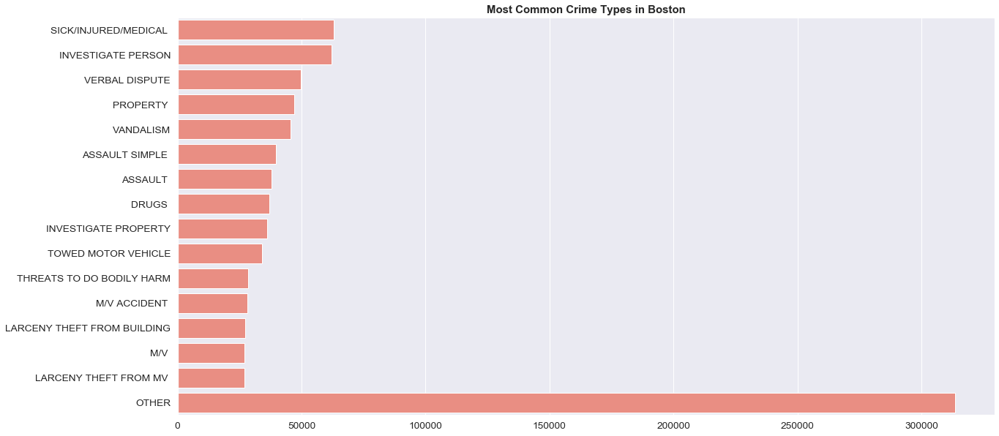

In [61]:
#plot proportion of types
incidents=get_series(df_incidents,'OFFENSE_CATEGORY',25000)
sns.set(font_scale = 1.25)
ax = sns.barplot(y=incidents.index, x=incidents.values, color="salmon")
ax.set_title('Most Common Crime Types in Boston', fontweight="bold")

There are more than 150 crime types happened in Boston. Out of those, Sick/Injured/Medical, Investigate, Dispute, Vandalism, and Assault are the most common.

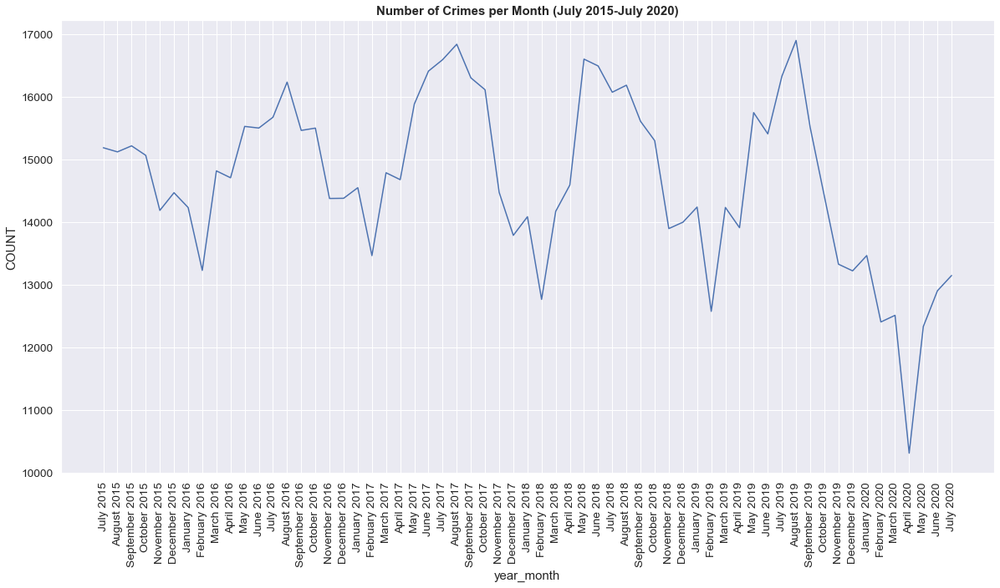

In [63]:
# plot number of crimes month-year 
import matplotlib.pyplot as plt
import datetime
df_incidents_monthly=df_incidents[~df_incidents['year_month'].isin(['June 2015','August 2020'])]
df_monthly=df_incidents_monthly.groupby('year_month').size().reset_index(name='COUNT')
df_monthly['year_month_ordered']=pd.to_datetime(df_monthly['year_month'], format='%B %Y')
df_monthly=df_monthly.sort_values('year_month_ordered')
ax=sns.lineplot(x='year_month', y="COUNT", data=df_monthly, sort=False)
ax1=plt.setp(ax.get_xticklabels(), rotation=90)
ax2=ax.set_title('Number of Crimes per Month (July 2015-July 2020)', fontweight="bold")

The graph above describes the trend of crimes in Boston. Repetitive patterns can be extracted from there, with August is month with the most incidents in the year and february the least. It can also be identified that starting from September 2019, the numbers keep dropping until April 2020 before bouncing back. In general, 2020 months have the lowest crime reports in Boston.

Text(0.5, 1.0, 'District with Highest Crimes')

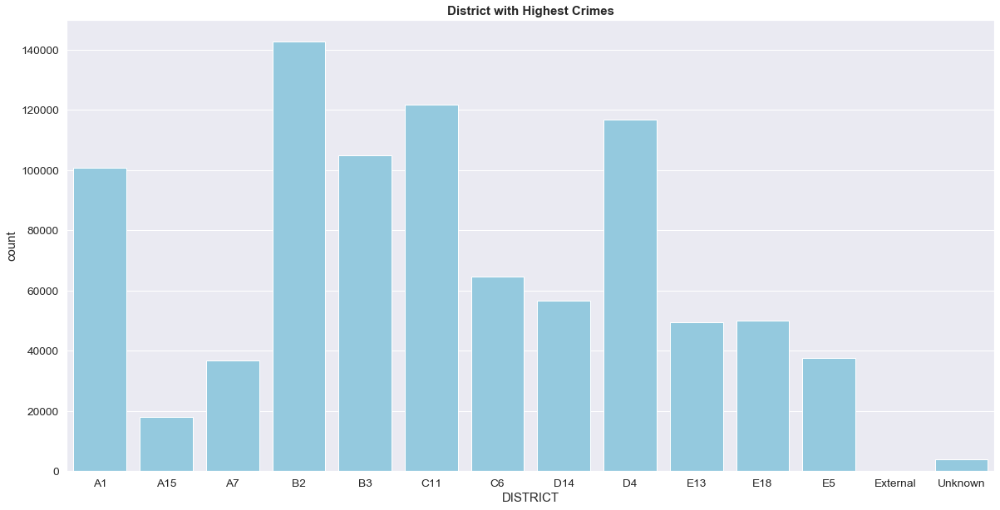

In [21]:
# plot number of crimes by districts
import numpy as np
districts=df_incidents['DISTRICT'].unique()
sns.set(font_scale = 1.25)
ax = sns.countplot(x='DISTRICT', data=df_incidents, order = np.sort(districts), color='skyblue')
ax.set_title('District with Highest Crimes', fontweight="bold")

From the chart above, some of the districts recorded more than 100k incidents over the past 5 years. B2, C11, and D4 are districts in which accidents occurs most often and district A15, A7, and E5 are the least. 

In [22]:
df_daily=df_incidents.groupby(['date']).size().reset_index(name='count')
print("Average Crime Reports per Day: ", int(df_daily['count'].mean()))

Average Crime Reports per Day:  481


#### Time Related Analysis

In this section, number of crimes will be inspected to gain some inisghts out of the data from time perspective

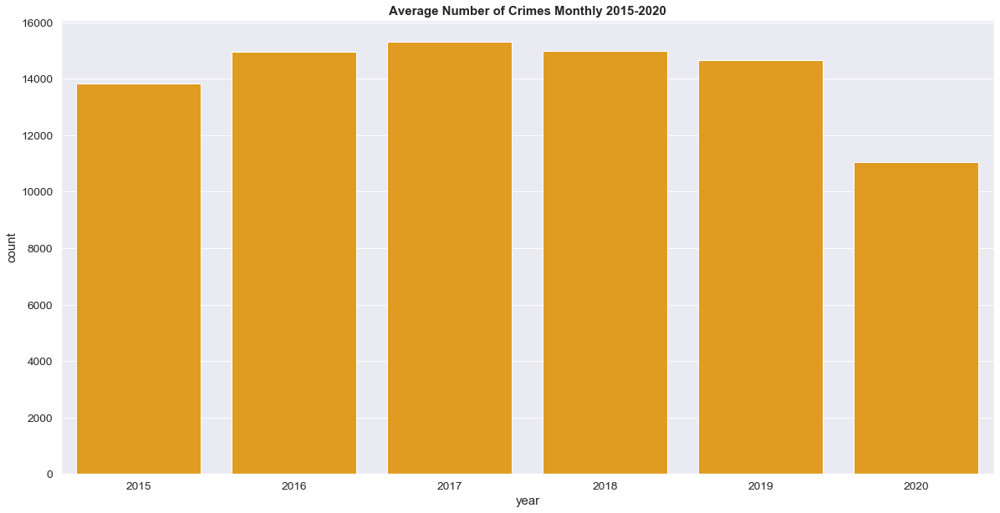

In [23]:
### average number of crimes per month
df_monthly_avg=df_incidents.groupby(['year','month']).size().reset_index(name='count')
df_monthly_avg=df_monthly_avg.groupby('year').mean().reset_index()
ax=sns.barplot(x='year', y='count', data=df_monthly_avg, color='orange')
ax=ax.set_title('Average Number of Crimes Monthly 2015-2020', fontweight="bold")

In [24]:
# df_daily_avg=df_incidents.groupby(['year','date']).size().reset_index(name='count')
# df_daily_avg=df_daily_avg.groupby('year').mean().reset_index()
# ax=sns.barplot(x='year', y='count', data=df_daily_avg, color='paleturquoise')
# ax=ax.set_title('Average Number of Crimes Daily 2015-2020', fontweight="bold")

The trend shows that crimes reached its peak in 2017 before declining afterwards

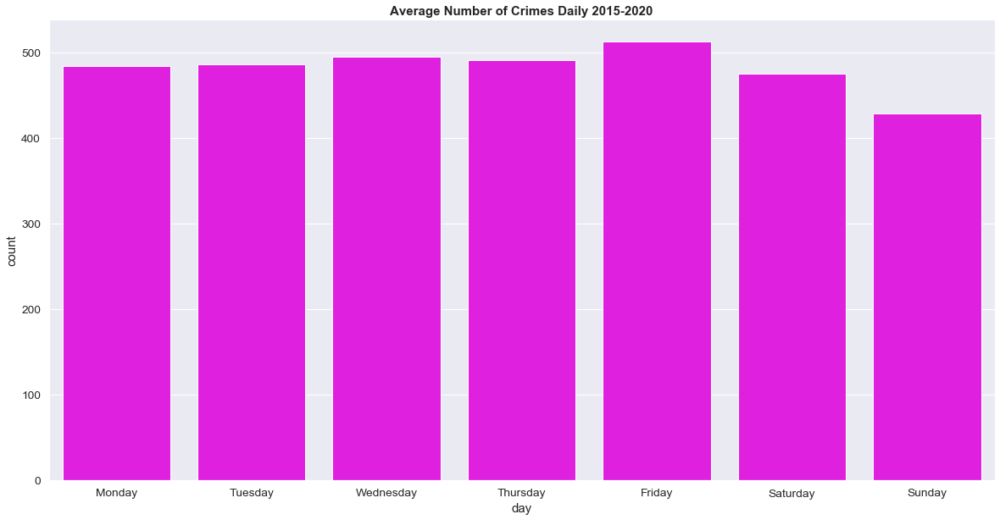

In [25]:
### average number of crimes per day
df_day_avg=df_incidents.groupby(['date','day']).size().reset_index(name='count')
df_day_avg=df_day_avg.groupby('day').mean().reset_index()
order_day=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
ax=sns.barplot(x='day', y='count', data=df_day_avg, color='magenta', order=order_day)
ax=ax.set_title('Average Number of Crimes Daily 2015-2020', fontweight="bold")

From the graph above, it can be implied that crimes less likely to occur on weekends. And friday has the highest number of reports to BPD

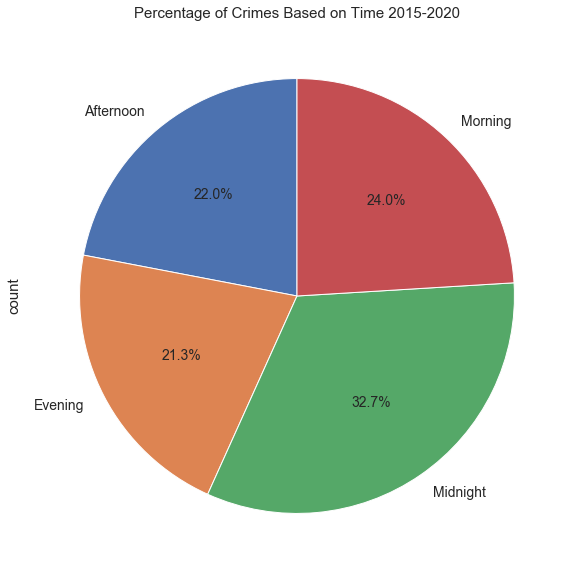

In [26]:
### average number of crimes per period
df_period_avg=df_incidents.groupby(['date','time_period']).size().reset_index(name='count')
df_period_avg=df_period_avg.groupby('time_period').mean().reset_index()
ax=df_period_avg.plot(kind='pie', y = 'count', autopct='%1.1f%%', 
 startangle=90,labels=df_period_avg['time_period'], legend=False, fontsize=14, 
 title='Percentage of Crimes Based on Time 2015-2020')

The bar chart above portrays how many crime were conducted during time period everyday. Most of the events occurred during midnight and morning and evening has the lowest number of incidents. 

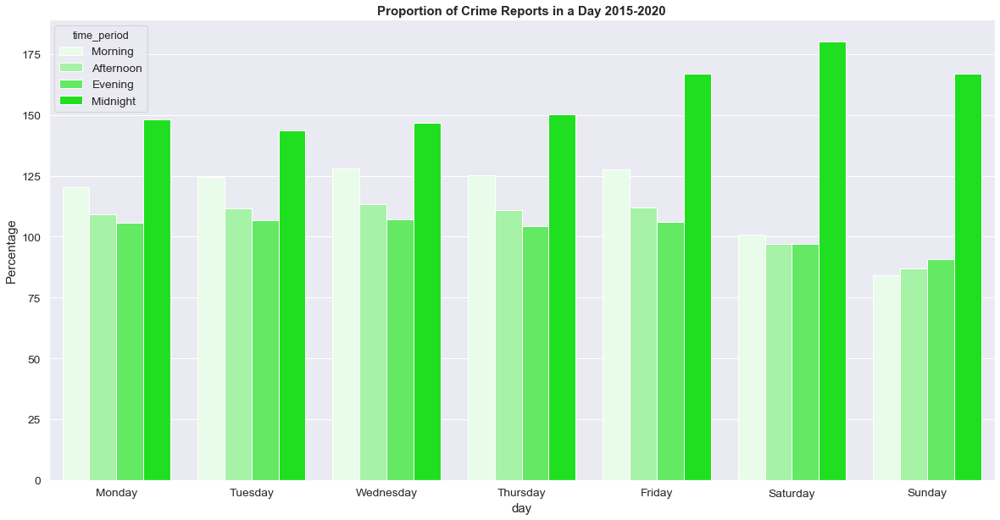

In [27]:
df_period_daily=df_incidents.groupby(['date','time_period','day']).size().reset_index(name='Percentage')
df_period_daily=df_period_daily.groupby(['time_period','day']).mean().reset_index()
df_period_daily['count'] = df_period_daily.groupby('day')['Percentage'].apply(lambda x:100 * x / float(x.sum()))
time_order=['Morning','Afternoon','Evening','Midnight']
ax=sns.barplot(x='day', hue='time_period', y='Percentage', data=df_period_daily, color='lime', order=order_day, hue_order=time_order)
ax=ax.set_title('Proportion of Crime Reports in a Day 2015-2020', fontweight="bold")

Multivariate wise, the patterns still the same. Midnight time has the highest likelihood a crime is commited

#### Type of crimes

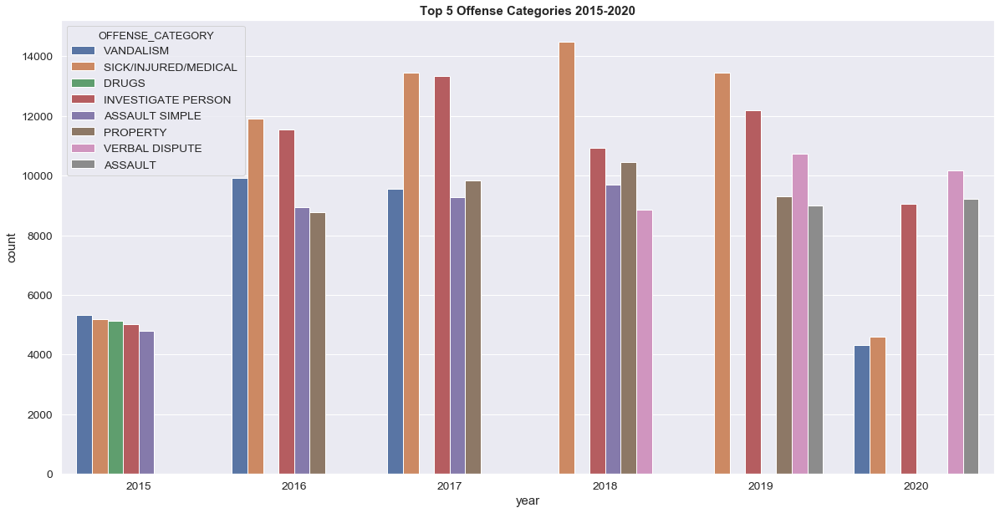

In [28]:
### most common types of crime yearly
df_type_yearly=df_incidents.groupby(['year','OFFENSE_CATEGORY']).size().reset_index(name='count')
df_type_yearly=df_type_yearly.groupby('year').apply(lambda x: x.sort_values(["count"], ascending = False)).reset_index(drop=True)
df_type_yearly=df_type_yearly.groupby('year').head(5)

# g = sns.factorplot(x='OFFENSE_CATEGORY',y='count',col='year',
#                    col_wrap=3,data=df_type_yearly,kind='bar',ci=None,legend=False,palette='muted')
# plt.suptitle('ED Visit Rate per 1,000 Members per Year',size=16)
# plt.legend(loc='best')
# plt.subplots_adjust(top=.925)
# plt.show()

ax=sns.barplot(x='year', hue='OFFENSE_CATEGORY', y='count', data=df_type_yearly)
ax=ax.set_title('Top 5 Offense Categories 2015-2020', fontweight="bold")

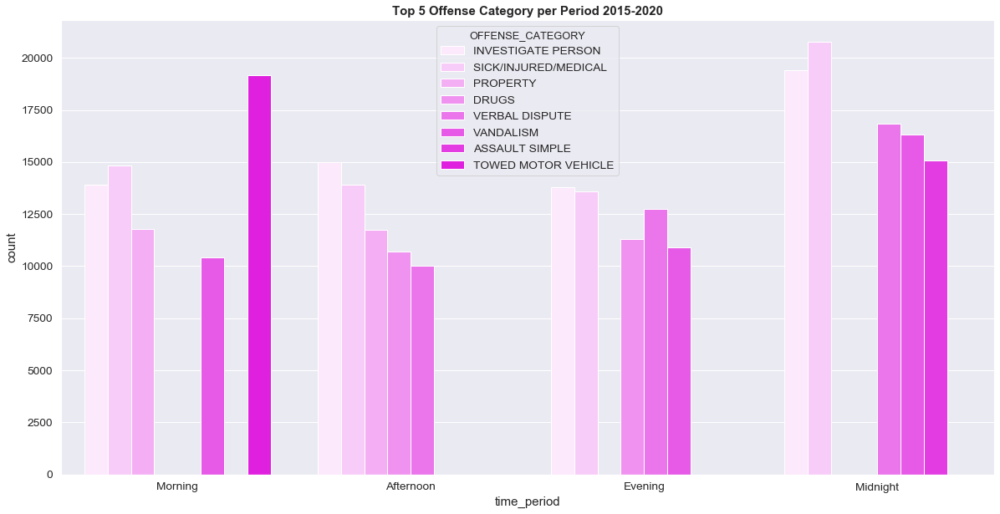

In [29]:
#### crimes happen in time period (use subplot)
df_type_period=df_incidents.groupby(['time_period','OFFENSE_CATEGORY']).size().reset_index(name='count')
df_type_period=df_type_period.groupby('time_period').apply(lambda x: x.sort_values(["count"], ascending = False)).reset_index(drop=True)
df_type_period=df_type_period.groupby('time_period').head(5)
ax=sns.barplot(x='time_period', hue='OFFENSE_CATEGORY', y='count', data=df_type_period, color='magenta', order=['Morning','Afternoon','Evening','Midnight'])
ax=ax.set_title('Top 5 Offense Category per Period 2015-2020', fontweight="bold")

In time-period basis, there are differences in crimes occurred iduring these times. Vehicle related incidents occurs in the morning and assault occurs only in the midnight. 

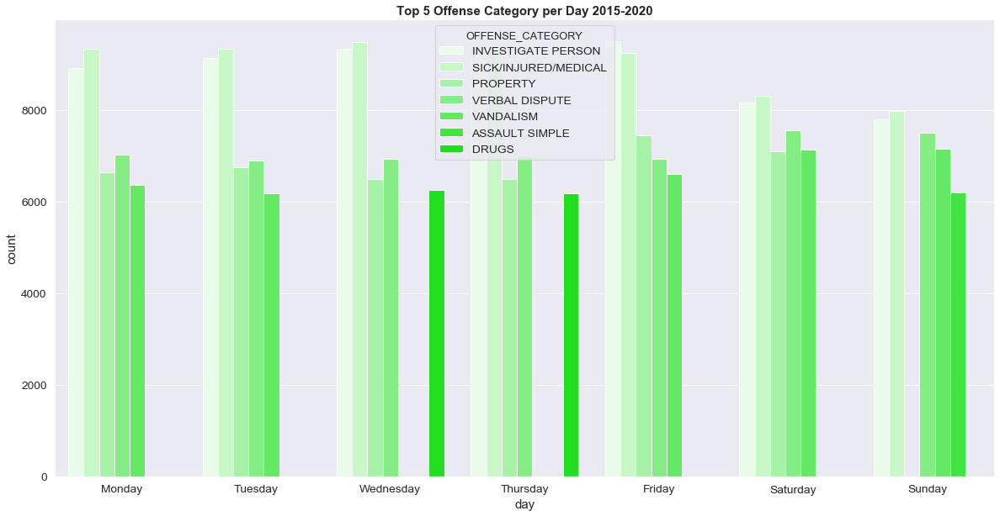

In [30]:
#based on day
df_type_month=df_incidents.groupby(['day','OFFENSE_CATEGORY']).size().reset_index(name='count')
df_type_month=df_type_month.groupby('day').apply(lambda x: x.sort_values(["count"], ascending = False)).reset_index(drop=True)
df_type_month=df_type_month.groupby('day').head(5)
ax=sns.barplot(x='day', hue='OFFENSE_CATEGORY', y='count', data=df_type_month, color='lime', order=order_day)
ax=ax.set_title('Top 5 Offense Category per Day 2015-2020', fontweight="bold")

The graph above shows that while investigate person, sick/injured/medical, and verbal dispute happen across all days, crimes related to drugs occur only on Wednesday and Thursday. In addition, simple assault occurs only on monday.

#### Geospatial Analysis

For this analysis, district column is taken into analysis to see whether a relationship exists between crime data and itself. 

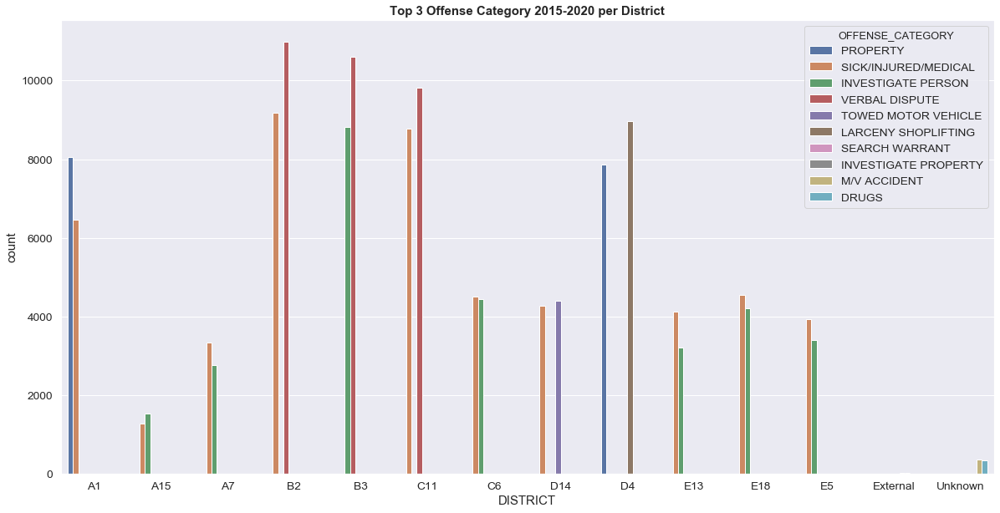

In [31]:
# district and types of crime
df_district_yearly=df_incidents.groupby(['DISTRICT','OFFENSE_CATEGORY']).size().reset_index(name='count')
df_district_yearly=df_district_yearly.groupby('DISTRICT').apply(lambda x: x.sort_values(["count"], ascending = False)).reset_index(drop=True)
df_district_yearly=df_district_yearly.groupby('DISTRICT').head(2)

ax=sns.barplot(x='DISTRICT', hue='OFFENSE_CATEGORY', y='count', data=df_district_yearly)
ax=ax.set_title('Top 3 Offense Category 2015-2020 per District', fontweight="bold")

The graph above displays that sick/injured/medical type of crimes occurred the most in 10 out of 14 district groups with district B2 and C11 have the most number.

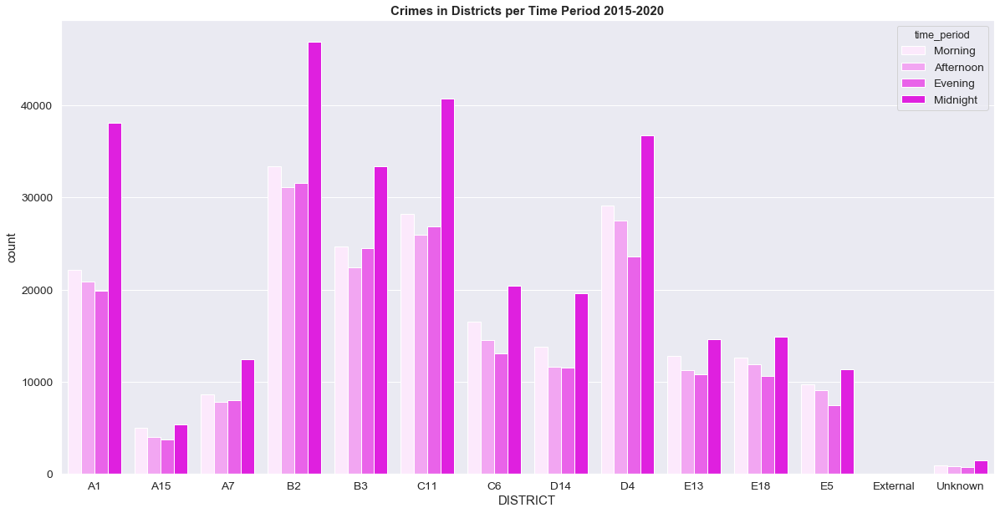

In [32]:
# district and time_period
df_district_period=df_incidents.groupby(['time_period','DISTRICT']).size().reset_index(name='count')
df_district_period=df_district_period.groupby('DISTRICT').apply(lambda x: x.sort_values(["count"], ascending = False)).reset_index(drop=True)
df_district_period=df_district_period.groupby('DISTRICT').head(5)
ax=sns.barplot(x='DISTRICT', hue='time_period', y='count', data=df_district_period, color='magenta', hue_order=['Morning','Afternoon','Evening','Midnight'])
ax=ax.set_title('Crimes in Districts per Time Period 2015-2020', fontweight="bold")

Last but not least, day of occurrence is also processed. Two days having the highest crime report for the past 5 years are extracted from each districts. It can be seen from the graph below that each district has different pattern, from Friday and Saturday in Downtown, Wednesay and Friday in south Boston, and Monday and Friday in North and East Boston. Geographical part plays a role in determining which day sees high crime records.

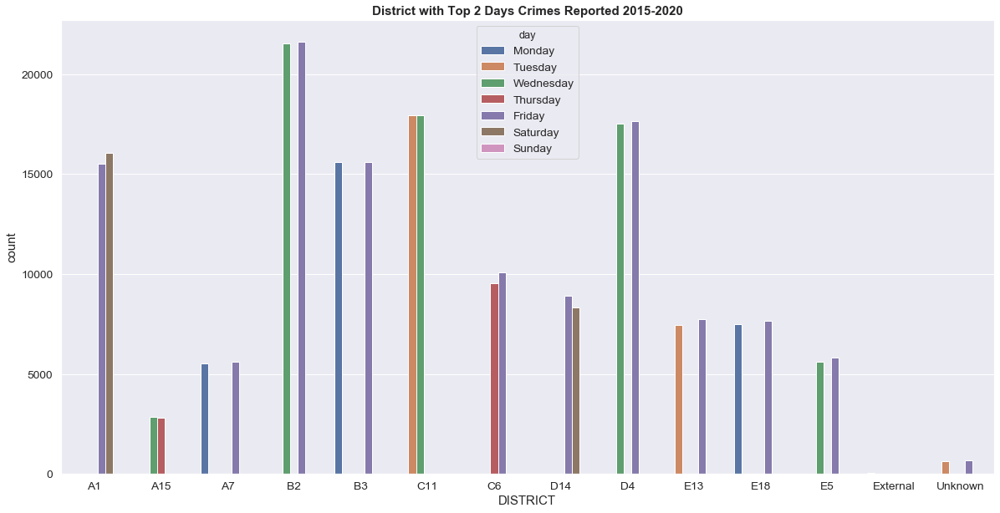

In [33]:
# district and day
df_district_day=df_incidents.groupby(['day','DISTRICT']).size().reset_index(name='count')
df_district_day=df_district_day.groupby('DISTRICT').apply(lambda x: x.sort_values(["count"], ascending = False)).reset_index(drop=True)
df_district_day=df_district_day.groupby('DISTRICT').head(2)
ax=sns.barplot(x='DISTRICT', hue='day', y='count', data=df_district_day,hue_order=order_day)
ax=ax.set_title('District with Top 2 Days Crimes Reported 2015-2020', fontweight="bold")

### Neighborhood Analysis

All codes in this section is run on google colab

#### Crime Rate per Neighborhood

In [ ]:
import geopandas
boston_neighborhood = geopandas.read_file('/content/Boston_Neighborhoods.geojson')
boston_neighborhood.head(5)

In [ ]:
from shapely.geometry import Point
from geopandas import GeoDataFrame
geometry = [Point(xy) for xy in zip(df_latlong_incidents['Long'], df_latlong_incidents['Lat'])]
df_latlong_incidents = df_latlong_incidents.drop(['Long', 'Lat'], axis=1)
gdf_latlong_incidents = GeoDataFrame(df_latlong_incidents, crs="EPSG:4326", geometry=geometry)
gdf_latlong_incidents 

In [ ]:
df_latlong_incidents=geopandas.sjoin(gdf_latlong_incidents, boston_neighborhood,how='right',op='intersects',rsuffix='neighborhoods')
df_latlong_incidents_2019=df_latlong_incidents[df_latlong_incidents['YEAR']==2019]
df_latlong_incidents_2019

In [ ]:
df_incidents_neighborhoods=df_latlong_incidents_2019[['INCIDENT_NUMBER','Name']].groupby(['Name']).size()
df_incidents_neighborhoods=df_incidents_neighborhoods.reset_index(name='No. of Incidents')
df_incidents_neighborhoods

In [ ]:
pop_data=pd.read_excel('/content/boston_neighborhoods_data.xlsx')
df_incidents_neighborhoods=df_incidents_neighborhoods.merge(boston_neighborhood[['Name','geometry']],how='inner', left_on='Name', right_on='Name')
df_incidents_neighborhoods=df_incidents_neighborhoods.merge(pop_data,how='inner', left_on='Name', right_on='Neighborhood')
df_incidents_neighborhoods

In [ ]:
df_incidents_neighborhoods['crime_rate']=df_incidents_neighborhoods['No. of Incidents']/df_incidents_neighborhoods['Total Population']
gdf_incidents_neighborhoods = geopandas.GeoDataFrame(df_incidents_neighborhoods, geometry='geometry', crs={'init': 'epsg:4326'})
gdf_incidents_neighborhoods

In [ ]:
import matplotlib.pyplot as plt
variable = 'crime_rate'
vmin, vmax = 0, 0.5
fig, ax = plt.subplots(1, figsize=(30, 10))
ax.axis('off')
ax.set_title('Crime Rate per Neighborhood', fontdict={'fontsize': '25', 'fontweight' : '3'})
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
fig.colorbar(sm)
gdf_incidents_neighborhoods.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
gdf_incidents_neighborhoods['coords'] = gdf_incidents_neighborhoods['geometry'].apply(lambda x: x.representative_point().coords[:])
gdf_incidents_neighborhoods['coords'] = [coords[0] for coords in gdf_incidents_neighborhoods['coords']]
for idx, row in gdf_incidents_neighborhoods.iterrows():
    plt.annotate(s=row['Name'], xy=row['coords'],horizontalalignment='center')
plt.savefig('crime_rate_neighborhood.png')

#### Number of Incidents per BPD Area

In [ ]:
police_districts=geopandas.read_file('/content/Police_Districts.geojson')
police_districts

In [ ]:
df_incidents_district=df_incidents[['INCIDENT_NUMBER','DISTRICT']].groupby('DISTRICT').size().reset_index(name='No. of Incidents')
df_incidents_district=df_incidents_district.merge(police_districts[['DISTRICT','geometry']], how='inner', left_on='DISTRICT', right_on='DISTRICT')
gdf_incidents_district=geopandas.GeoDataFrame(df_incidents_district, geometry='geometry', crs={'init': 'epsg:4326'})
gdf_incidents_district

In [ ]:
variable = 'No. of Incidents'
vmin, vmax = 0, 100000
fig, ax = plt.subplots(1, figsize=(30, 10))
ax.axis('off')
ax.set_title('# of Incidents per District', fontdict={'fontsize': '25', 'fontweight' : '3'})
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
fig.colorbar(sm)
gdf_incidents_district.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
gdf_incidents_district['coords'] = gdf_incidents_district['geometry'].apply(lambda x: x.representative_point().coords[:])
gdf_incidents_district['coords'] = [coords[0] for coords in gdf_incidents_district['coords']]
for idx, row in gdf_incidents_district.iterrows():
    plt.annotate(s=row['DISTRICT'], xy=row['coords'],horizontalalignment='center')
plt.savefig('incidents_district.png')

### Cluster analysis

#### DBScan

for this part, crimes within 1 kms are grouped based on their locations. Algorithm used here is DBScan as the shape of Boston might not be circular. For this analysis, rows without lat long coordiantes are taken out.

In [34]:
df_latlong_incidents=df_incidents.loc[(~df_incidents['Lat'].isnull())&(~df_incidents['Long'].isnull())]
coords = df_latlong_incidents[['Lat', 'Long']].to_numpy()

In [35]:
# using db scan
from sklearn.cluster import DBSCAN
import numpy as np
kms_per_radian = 6371.0088
epsilon = 1.0 / kms_per_radian
db = DBSCAN(eps=epsilon, min_samples=5, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
cluster_labels = db.labels_
num_clusters = len(set(cluster_labels))
clusters = pd.Series([coords[cluster_labels == n] for n in range(num_clusters)])
print('Number of clusters: {}'.format(num_clusters))

Once points are assigned to cluster, analysis of these groups can be done to get general information about each group, like how big it is, the 'centroid' of each cluster, and so on.

In [4]:
df_cluster_result=pd.read_pickle('C:/Users/OVO/Downloads/dbscan_result.pkl')
df_cluster_result=df_cluster_result.groupby('cluster').agg({'INCIDENT_NUMBER':['count',lambda x: list(x)], 
                         'Location':lambda x: list(x),                    
                         'OCCURRED_ON_DATE':lambda x: list(x)
                        })
df_cluster_result=df_cluster_result.reset_index()
col_name=['cluster_id','cluster_size','incidents','coordinates','dates']
df_cluster_result.columns=col_name
df_cluster_result

,cluster_id,cluster_size,incidents,coordinates,dates
0,0,27320,"[S97333701, I92102201, I92097173, I92089785, I...","[(42.33081300, -71.05136800), (42.32512200, -7...","[2020-07-18 14:34:00, 2019-12-20 03:08:00, 201..."
1,1,137,"[S47513131, I192078378, I192078360, I192077860...","[(42.23949100, -71.13595400), (42.24302939, -7...","[2020-06-24 10:15:00, 2019-09-28 09:28:00, 201..."
2,2,2038,"[I92094519, I20200024, I192082680, I192078612,...","[(42.35512000, -71.16267800), (42.35034100, -7...","[2019-11-22 07:50:00, 2020-01-02 07:00:00, 201..."
3,3,221,"[I20210846, I192078538, I192078419, I192078318...","[(42.35275600, -71.04748100), (42.35196451, -7...","[2020-02-09 00:30:00, 2019-09-28 16:35:00, 201..."
4,4,606,"[I20207994, I20203469, I192079582, I192078436,...","[(42.37380000, -71.06290300), (42.37596200, -7...","[2020-04-19 13:30:00, 2020-03-28 00:00:00, 201..."
...,...,...,...,...,...
105,105,1,[I192046140],"[(42.27904553, -71.14727186)]",[2019-05-15 12:00:00]
106,106,1,[I192045923],"[(42.34005140, -71.16359520)]",[2019-06-16 22:30:00]
107,107,1,[I192044828],"[(42.29327594, -71.16872347)]",[2019-06-13 12:49:00]
108,108,1,[I192043318],"[(42.29512421, -71.16405686)]",[2019-06-08 14:23:00]


In [5]:
import ast
def get_centroid(coordinates):
    length=len(coordinates)
    if len==1:
        return (coordinates[0])
    else:
        lat_avg=0.0
        long_avg=0.0
        for coord in coordinates:
            coord=ast.literal_eval(coord)
            lat_avg=lat_avg+float(coord[1])
            long_avg=long_avg+float(coord[0])
        return [long_avg/length, lat_avg/length]
    
df_cluster_result['centroid']=df_cluster_result['coordinates'].apply(lambda x: get_centroid(x))
df_cluster_result

,cluster_id,cluster_size,incidents,coordinates,dates,centroid
0,0,27320,"[S97333701, I92102201, I92097173, I92089785, I...","[(42.33081300, -71.05136800), (42.32512200, -7...","[2020-07-18 14:34:00, 2019-12-20 03:08:00, 201...","[42.31680778320576, -71.08064651487811]"
1,1,137,"[S47513131, I192078378, I192078360, I192077860...","[(42.23949100, -71.13595400), (42.24302939, -7...","[2020-06-24 10:15:00, 2019-09-28 09:28:00, 201...","[42.240502502481725, -71.13480334547445]"
2,2,2038,"[I92094519, I20200024, I192082680, I192078612,...","[(42.35512000, -71.16267800), (42.35034100, -7...","[2019-11-22 07:50:00, 2020-01-02 07:00:00, 201...","[42.35101039233079, -71.14303377842509]"
3,3,221,"[I20210846, I192078538, I192078419, I192078318...","[(42.35275600, -71.04748100), (42.35196451, -7...","[2020-02-09 00:30:00, 2019-09-28 16:35:00, 201...","[42.35147136787325, -71.04798639552035]"
4,4,606,"[I20207994, I20203469, I192079582, I192078436,...","[(42.37380000, -71.06290300), (42.37596200, -7...","[2020-04-19 13:30:00, 2020-03-28 00:00:00, 201...","[42.377864486567624, -71.06186201620466]"
...,...,...,...,...,...,...
105,105,1,[I192046140],"[(42.27904553, -71.14727186)]",[2019-05-15 12:00:00],"[42.27904553, -71.14727186]"
106,106,1,[I192045923],"[(42.34005140, -71.16359520)]",[2019-06-16 22:30:00],"[42.3400514, -71.1635952]"
107,107,1,[I192044828],"[(42.29327594, -71.16872347)]",[2019-06-13 12:49:00],"[42.29327594, -71.16872347]"
108,108,1,[I192043318],"[(42.29512421, -71.16405686)]",[2019-06-08 14:23:00],"[42.29512421, -71.16405686]"


In [6]:
def get_latlong(coord, flag):
    if flag=='long':
        return float(coord[1])
    elif flag=='lat':
        return float(coord[0])
        
df_cluster_result['lat']=df_cluster_result['centroid'].apply(lambda x: get_latlong(x,'lat'))
df_cluster_result['long']=df_cluster_result['centroid'].apply(lambda x: get_latlong(x,'long'))
df_cluster_result

,cluster_id,cluster_size,incidents,coordinates,dates,centroid,lat,long
0,0,27320,"[S97333701, I92102201, I92097173, I92089785, I...","[(42.33081300, -71.05136800), (42.32512200, -7...","[2020-07-18 14:34:00, 2019-12-20 03:08:00, 201...","[42.31680778320576, -71.08064651487811]",42.316808,-71.080647
1,1,137,"[S47513131, I192078378, I192078360, I192077860...","[(42.23949100, -71.13595400), (42.24302939, -7...","[2020-06-24 10:15:00, 2019-09-28 09:28:00, 201...","[42.240502502481725, -71.13480334547445]",42.240503,-71.134803
2,2,2038,"[I92094519, I20200024, I192082680, I192078612,...","[(42.35512000, -71.16267800), (42.35034100, -7...","[2019-11-22 07:50:00, 2020-01-02 07:00:00, 201...","[42.35101039233079, -71.14303377842509]",42.351010,-71.143034
3,3,221,"[I20210846, I192078538, I192078419, I192078318...","[(42.35275600, -71.04748100), (42.35196451, -7...","[2020-02-09 00:30:00, 2019-09-28 16:35:00, 201...","[42.35147136787325, -71.04798639552035]",42.351471,-71.047986
4,4,606,"[I20207994, I20203469, I192079582, I192078436,...","[(42.37380000, -71.06290300), (42.37596200, -7...","[2020-04-19 13:30:00, 2020-03-28 00:00:00, 201...","[42.377864486567624, -71.06186201620466]",42.377864,-71.061862
...,...,...,...,...,...,...,...,...
105,105,1,[I192046140],"[(42.27904553, -71.14727186)]",[2019-05-15 12:00:00],"[42.27904553, -71.14727186]",42.279046,-71.147272
106,106,1,[I192045923],"[(42.34005140, -71.16359520)]",[2019-06-16 22:30:00],"[42.3400514, -71.1635952]",42.340051,-71.163595
107,107,1,[I192044828],"[(42.29327594, -71.16872347)]",[2019-06-13 12:49:00],"[42.29327594, -71.16872347]",42.293276,-71.168723
108,108,1,[I192043318],"[(42.29512421, -71.16405686)]",[2019-06-08 14:23:00],"[42.29512421, -71.16405686]",42.295124,-71.164057


To give a better understanding of clsutering result, these groups will be plotted over an actual Boston Map. This will give insights of how good the DBSCAN performs.

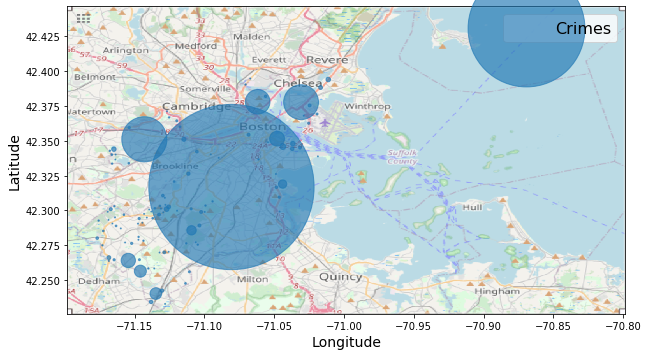

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
california_img=mpimg.imread('boston_updated.png')
ax = df_cluster_result.plot(kind="scatter", x="long", y="lat", figsize=(10,8),
                       s=df_cluster_result['cluster_size'], label="Crimes",
#                      c="median_house_value", cmap=plt.get_cmap("jet"),colorbar=False, 
                       alpha=0.65)
plt.imshow(california_img, extent=[-71.1983, -70.7986, 42.2260, 42.4463], alpha=0.8)
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)

# prices = housing["median_house_value"]
# tick_values = np.linspace(prices.min(), prices.max(), 11)
# cbar = plt.colorbar()
# cbar.ax.set_yticklabels(["$%dk"%(round(v/1000)) for v in tick_values], fontsize=14)
# cbar.set_label('Median House Value', fontsize=16)

plt.legend(fontsize=16)
plt.show()

A more advanced visualization technique is using an interactive map above which formed clusters are drawed. The larger its clusters, the larger its marker will be. It can be seen that the clusters are varying in size, some are small enough but a cluster is too large to cover an entire city.  

In [22]:
import folium
from folium.plugins import MarkerCluster
map_osm = folium.Map(location=[42.3126,-70.9978], zoom_start=11)

df_cluster_result.apply(lambda row:
folium.Circle(location=[row['lat'],row['long']], popup=row['cluster_id'], radius=row['cluster_size'],
      color='cadetblue', fill=True, fill_color='cadetblue').add_to(map_osm), axis=1)

map_osm

### using hdbscan

As an improvement of DBSCAN algorithm, we would like to introduce a hierarchical version of DBSCAN, HDBSCAN, which gives flexibility of cluster epsilon. So clusters produced might not be uniformly equal in area coverage, but still retaining non circluar-shape

In [28]:
df_hdbscan_cluster_result=pd.read_pickle('C:/Users/OVO/Downloads/hdbscan_result.pkl')
df_hdbscan_cluster_outliers=df_hdbscan_cluster_result[df_hdbscan_cluster_result['cluster']==-1]
df_hdbscan_clusters=df_hdbscan_cluster_result[df_hdbscan_cluster_result['cluster']!=-1]

In [29]:
df_hdbscan_cluster_outliers=df_hdbscan_cluster_outliers.reset_index(drop=True)
df_hdbscan_cluster_outliers['cluster']=str(-1)+'.'+df_hdbscan_cluster_outliers.index.map(str)
df_hdbscan_cluster_outliers

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,cluster
0,I192078645,3301,Verbal Disputes,VERBAL DISPUTE,B3,450,NaN,2019-09-29 06:00:00,2019,9,Sunday,6,Part Three,ASPINWALL RD,42.291816,-71.072441,"(42.29181580, -71.07244098)",-1.0
1,I192078645,1402,Vandalism,VANDALISM,B3,450,NaN,2019-09-29 06:00:00,2019,9,Sunday,6,Part Two,ASPINWALL RD,42.291816,-71.072441,"(42.29181580, -71.07244098)",-1.1
2,I192078628,3115,Investigate Person,INVESTIGATE PERSON,B2,328,NaN,2019-09-29 03:19:00,2019,9,Sunday,3,Part Three,MAGNOLIA ST,42.311935,-71.073420,"(42.31193478, -71.07341982)",-1.2
3,I192078623,3802,Motor Vehicle Accident Response,M/V ACCIDENT - PROPERTY DAMAGE,C11,400,NaN,2019-09-28 22:40:00,2019,9,Saturday,22,Part Three,MONTAGUE ST,42.286065,-71.070010,"(42.28606484, -71.07001038)",-1.3
4,I192078590,522,Residential Burglary,BURGLARY - RESIDENTIAL - NO FORCE,B2,603,NaN,2019-09-29 00:32:00,2019,9,Sunday,0,Part One,PONTIAC ST,42.331181,-71.101575,"(42.33118138, -71.10157550)",-1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2047,I192041474,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,E18,511,NaN,2019-06-01 05:00:00,2019,6,Saturday,5,Part One,VOSE AVE,42.256533,-71.113624,"(42.25653339, -71.11362352)",-1.2047
2048,I192041468,3301,Verbal Disputes,VERBAL DISPUTE,E5,725,NaN,2019-06-02 18:24:00,2019,6,Sunday,18,Part Three,SPRING VALLEY RD,42.275626,-71.168445,"(42.27562629, -71.16844455)",-1.2048
2049,I192041466,3115,Investigate Person,INVESTIGATE PERSON,E13,289,NaN,2019-06-02 22:01:00,2019,6,Sunday,22,Part Three,WASHINGTON ST,42.309719,-71.104294,"(42.30971857, -71.10429432)",-1.2049
2050,I192041424,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,B2,261,NaN,2019-06-02 15:15:00,2019,6,Sunday,15,Part One,JULIAN ST,42.318947,-71.074528,"(42.31894677, -71.07452770)",-1.2050


In [30]:
df_hdbscan_cluster_result=df_hdbscan_cluster_outliers.append(df_hdbscan_clusters)
df_hdbscan_cluster_result

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,cluster
0,I192078645,3301,Verbal Disputes,VERBAL DISPUTE,B3,450,NaN,2019-09-29 06:00:00,2019,9,Sunday,6,Part Three,ASPINWALL RD,42.291816,-71.072441,"(42.29181580, -71.07244098)",-1.0
1,I192078645,1402,Vandalism,VANDALISM,B3,450,NaN,2019-09-29 06:00:00,2019,9,Sunday,6,Part Two,ASPINWALL RD,42.291816,-71.072441,"(42.29181580, -71.07244098)",-1.1
2,I192078628,3115,Investigate Person,INVESTIGATE PERSON,B2,328,NaN,2019-09-29 03:19:00,2019,9,Sunday,3,Part Three,MAGNOLIA ST,42.311935,-71.073420,"(42.31193478, -71.07341982)",-1.2
3,I192078623,3802,Motor Vehicle Accident Response,M/V ACCIDENT - PROPERTY DAMAGE,C11,400,NaN,2019-09-28 22:40:00,2019,9,Saturday,22,Part Three,MONTAGUE ST,42.286065,-71.070010,"(42.28606484, -71.07001038)",-1.3
4,I192078590,522,Residential Burglary,BURGLARY - RESIDENTIAL - NO FORCE,B2,603,NaN,2019-09-29 00:32:00,2019,9,Sunday,0,Part One,PONTIAC ST,42.331181,-71.101575,"(42.33118138, -71.10157550)",-1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34900,I192041373,3201,Property Lost,PROPERTY - LOST,D4,172,NaN,2019-05-31 10:30:00,2019,5,Friday,10,Part Three,MASSACHUSETTS AVE,42.333391,-71.073120,"(42.33339068, -71.07312006)",2244
34901,I192041371,3114,Investigate Property,INVESTIGATE PROPERTY,C6,195,NaN,2019-05-30 14:30:00,2019,5,Thursday,14,Part Three,OLD COLONY AVE,42.333976,-71.054631,"(42.33397571, -71.05463126)",2623
34902,I192041370,3410,Towed,TOWED MOTOR VEHICLE,C11,243,NaN,2019-06-02 08:04:00,2019,6,Sunday,8,Part Three,MORRILL ST,42.316331,-71.060350,"(42.31633114, -71.06035002)",3726
34903,I192041369,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C6,186,NaN,2019-06-02 10:45:00,2019,6,Sunday,10,Part Three,ALLSTATE RD,42.326966,-71.061986,"(42.32696647, -71.06198607)",771


Again, analysis of clusters are performed to givedeeper information of each group

In [31]:
df_hdbscan_cluster_result=df_hdbscan_cluster_result.groupby('cluster').agg({'INCIDENT_NUMBER':['count',lambda x: list(x)], 
                         'Location':lambda x: list(x),                    
                         'OCCURRED_ON_DATE':lambda x: list(x)
                        })
df_hdbscan_cluster_result=df_hdbscan_cluster_result.reset_index()
col_name=['cluster_id','cluster_size','incidents','coordinates','dates']
df_hdbscan_cluster_result.columns=col_name
df_hdbscan_cluster_result['centroid']=df_hdbscan_cluster_result['coordinates'].apply(lambda x: get_centroid(x))
df_hdbscan_cluster_result

,cluster_id,cluster_size,incidents,coordinates,dates,centroid
0,0,42,"[I192078545, I192078197, I192077304, I19207703...","[(-1.00000000, -1.00000000), (-1.00000000, -1....","[2019-09-28 20:55:00, 2019-07-30 00:00:00, 201...","[-1.0, -1.0]"
1,1,7,"[I192067469, I192062419, I192060571, I19205966...","[(42.23490232, -71.13791008), (42.23490232, -7...","[2019-08-25 23:26:00, 2019-08-10 00:23:00, 201...","[42.23490232, -71.13791008]"
2,2,5,"[I192066150, I192052153, I192048776, I19204705...","[(42.23405146, -71.13882916), (42.23405146, -7...","[2019-08-21 20:25:00, 2019-07-08 08:36:00, 201...","[42.23405146, -71.13882916]"
3,3,11,"[I192067888, I192065200, I192064891, I19205967...","[(42.24260011, -71.13035022), (42.24260011, -7...","[2019-08-27 09:00:00, 2019-08-19 11:08:00, 201...","[42.242600110000005, -71.13035021999998]"
4,4,4,"[I192078360, I192052060, I192052060, I192050898]","[(42.24637931, -71.13627572), (42.24637931, -7...","[2019-09-28 06:52:00, 2019-07-07 18:00:00, 201...","[42.24637931, -71.13627572]"
...,...,...,...,...,...,...
6287,-1.995,1,[I192061158],"[(42.34815229, -71.08450821)]",[2019-08-04 23:00:00],"[42.34815229, -71.08450821]"
6288,-1.996,1,[I192061153],"[(42.32323874, -71.07380008)]",[2019-08-06 08:33:00],"[42.32323874, -71.07380008]"
6289,-1.997,1,[I192061115],"[(42.26205732, -71.11145585)]",[2019-08-06 01:35:00],"[42.26205732, -71.11145585]"
6290,-1.998,1,[I192061107],"[(42.35287295, -71.07118968)]",[2019-08-05 23:57:00],"[42.35287295, -71.07118968]"


In [32]:
df_hdbscan_cluster_result['lat']=df_hdbscan_cluster_result['centroid'].apply(lambda x: get_latlong(x,'lat'))
df_hdbscan_cluster_result['long']=df_hdbscan_cluster_result['centroid'].apply(lambda x: get_latlong(x,'long'))
df_hdbscan_cluster_result

,cluster_id,cluster_size,incidents,coordinates,dates,centroid,lat,long
0,0,42,"[I192078545, I192078197, I192077304, I19207703...","[(-1.00000000, -1.00000000), (-1.00000000, -1....","[2019-09-28 20:55:00, 2019-07-30 00:00:00, 201...","[-1.0, -1.0]",-1.000000,-1.000000
1,1,7,"[I192067469, I192062419, I192060571, I19205966...","[(42.23490232, -71.13791008), (42.23490232, -7...","[2019-08-25 23:26:00, 2019-08-10 00:23:00, 201...","[42.23490232, -71.13791008]",42.234902,-71.137910
2,2,5,"[I192066150, I192052153, I192048776, I19204705...","[(42.23405146, -71.13882916), (42.23405146, -7...","[2019-08-21 20:25:00, 2019-07-08 08:36:00, 201...","[42.23405146, -71.13882916]",42.234051,-71.138829
3,3,11,"[I192067888, I192065200, I192064891, I19205967...","[(42.24260011, -71.13035022), (42.24260011, -7...","[2019-08-27 09:00:00, 2019-08-19 11:08:00, 201...","[42.242600110000005, -71.13035021999998]",42.242600,-71.130350
4,4,4,"[I192078360, I192052060, I192052060, I192050898]","[(42.24637931, -71.13627572), (42.24637931, -7...","[2019-09-28 06:52:00, 2019-07-07 18:00:00, 201...","[42.24637931, -71.13627572]",42.246379,-71.136276
...,...,...,...,...,...,...,...,...
6287,-1.995,1,[I192061158],"[(42.34815229, -71.08450821)]",[2019-08-04 23:00:00],"[42.34815229, -71.08450821]",42.348152,-71.084508
6288,-1.996,1,[I192061153],"[(42.32323874, -71.07380008)]",[2019-08-06 08:33:00],"[42.32323874, -71.07380008]",42.323239,-71.073800
6289,-1.997,1,[I192061115],"[(42.26205732, -71.11145585)]",[2019-08-06 01:35:00],"[42.26205732, -71.11145585]",42.262057,-71.111456
6290,-1.998,1,[I192061107],"[(42.35287295, -71.07118968)]",[2019-08-05 23:57:00],"[42.35287295, -71.07118968]",42.352873,-71.071190


From the two visualization results below, we see that dbscan produces more clusters compared to DBSCAN whcih sizes are not deviating too much from the average. Then, it can be concluded that this algorithm works the best for this dataset

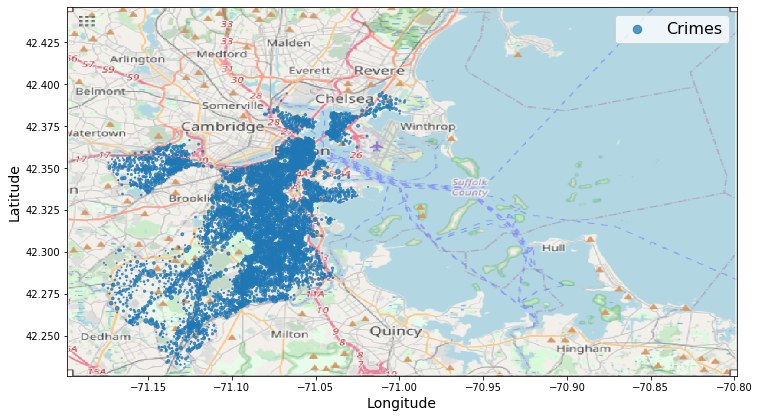

In [33]:
import numpy as np
import matplotlib.image as mpimg
california_img=mpimg.imread('boston_updated.png')
ax = df_hdbscan_cluster_result.plot(kind="scatter", x="long", y="lat", figsize=(12,12),
                       s=df_hdbscan_cluster_result['cluster_size'], label="Crimes",
#                      c="median_house_value", cmap=plt.get_cmap("jet"),colorbar=False, 
                       alpha=0.75)
plt.imshow(california_img, extent=[-71.1983, -70.7986, 42.2260, 42.4463], alpha=0.9)
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)

plt.legend(fontsize=16)
plt.show()

A closer look gives insight in which area crimes are reported the most and its cluster size. Hopefully, this will give a betetr comprehension to locate which area's security should be tighten up

In [35]:
## using leaflet
map_osm = folium.Map(location=[42.3126,-70.9978], zoom_start=11)

df_hdbscan_cluster_result.apply(lambda row:
folium.Circle(location=[row['lat'],row['long']], popup='Number of Incidents: '+str(row['cluster_size']), radius=row['cluster_size'],
      color='crimson', fill=True, fill_color='crimson').add_to(map_osm), axis=1)

map_osm

### Reference

python color reference https://python-graph-gallery.com/100-calling-a-color-with-seaborn/<br>
python dbscan clustering on geospatial data https://geoffboeing.com/2014/08/clustering-to-reduce-spatial-data-set-size/